In [2]:
!pip3 install librosa

     |████████████████████████████████| 203 kB 1.0 MB/s eta 0:00:01
     |████████████████████████████████| 2.2 MB 1.0 MB/s eta 0:00:01
     |████████████████████████████████| 51 kB 670 kB/s eta 0:00:01
     |████████████████████████████████| 323 kB 1.1 MB/s eta 0:00:01
     |████████████████████████████████| 613 kB 1.0 MB/s eta 0:00:01
     |████████████████████████████████| 377 kB 1.1 MB/s eta 0:00:01
     |████████████████████████████████| 18.5 MB 61.4 MB/s eta 0:00:01
  Created wheel for audioread: filename=audioread-2.1.9-py3-none-any.whl size=23141 sha256=39f24b09b33b9edcc92113b54647f31af4a349d5e677ba0bd8c33ee5e6d5a462
  Stored in directory: /Users/vpapadop/Library/Caches/pip/wheels/a2/a3/bd/ec1568ce7515115a11ab686d509ad302124c782af065de47ee
  Created wheel for resampy: filename=resampy-0.2.2-py3-none-any.whl size=320718 sha256=b6daa10d7facda108d2424e3ad448576ecc39ff3d7f2d3b524844eb42db63c42
  Stored in directory: /Users/vpapadop/Library/Caches/pip/wheels/86/2c/7d/46a32a246b0e593

In [47]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

In [48]:
# helper
def contains_number(s):
    return any(i.isdigit() for i in s)

In [73]:
#check source directory and find classes
source_dir = './audio/'
speakers = [name for name in os.listdir(source_dir) if os.path.isdir(os.path.join(source_dir, name))]
print(speakers)

raw = {}
for speaker in speakers:
    path = os.path.join(source_dir, speaker) + '/'
    print('checking dir:', path)
    clips = [f for f in os.listdir(path) if f.endswith('.wav')]
    if len(clips) == 0:
        print(f'dir:{path} is empty')
    else:
        for clip in clips:
            
            if not contains_number(clip) :
                pass
            if speaker in raw:
                raw[speaker].append(path+clip)
            else:
                raw[speaker] = [path+clip]
        
        

['eminem', 'lewis_hamilton', 'neil_degrasse_tyson', 'brian_greene', 'christiano_ronaldo']
checking dir: ./audio/eminem/
dir:./audio/eminem/ is empty
checking dir: ./audio/lewis_hamilton/
dir:./audio/lewis_hamilton/ is empty
checking dir: ./audio/neil_degrasse_tyson/
checking dir: ./audio/brian_greene/
checking dir: ./audio/christiano_ronaldo/


In [119]:
# for every speaker calculate mfcc feature
data = {}
i = 0
for speaker, clip in raw.items():
    print(speaker)
    for audio in clip:
        signal ,sr = librosa.load(audio)
        mfccs = librosa.feature.mfcc(signal, n_mfcc=13, sr=sr)
        print(mfccs.shape)
        data[i] = {'path':audio, 'mfcc' :mfccs, 'speaker':speaker}
        i += 1

neil_degrasse_tyson
(13, 216)
(13, 216)
(13, 216)
(13, 216)
(13, 216)
brian_greene
(13, 216)
(13, 216)
(13, 216)
(13, 216)
(13, 216)
christiano_ronaldo
(13, 216)
(13, 216)
(13, 216)
(13, 216)
(13, 216)


In [120]:
df = pd.DataFrame.from_dict(data, orient='index')
df.reset_index()
df.head(100)


,path,mfcc,speaker
0,./audio/neil_degrasse_tyson/clip_1.wav,"[[-190.86404, -199.985, -230.80222, -254.21854...",neil_degrasse_tyson
1,./audio/neil_degrasse_tyson/clip_3.wav,"[[-203.53627, -230.26552, -255.53778, -282.818...",neil_degrasse_tyson
2,./audio/neil_degrasse_tyson/clip_2.wav,"[[-567.0825, -557.43036, -496.17844, -412.8795...",neil_degrasse_tyson
3,./audio/neil_degrasse_tyson/clip_5.wav,"[[-408.3656, -420.6227, -456.46277, -389.33218...",neil_degrasse_tyson
4,./audio/neil_degrasse_tyson/clip_4.wav,"[[-588.33923, -567.55975, -471.29666, -386.721...",neil_degrasse_tyson
5,./audio/brian_greene/clip_1.wav,"[[-654.2273, -654.2273, -589.06915, -492.66467...",brian_greene
6,./audio/brian_greene/clip_3.wav,"[[-265.88742, -246.8308, -243.16258, -275.9386...",brian_greene
7,./audio/brian_greene/clip_2.wav,"[[-180.7568, -176.60117, -203.13358, -229.7762...",brian_greene
8,./audio/brian_greene/clip_5.wav,"[[-341.86392, -332.87262, -328.90872, -307.727...",brian_greene
9,./audio/brian_greene/clip_4.wav,"[[-234.7251, -203.24739, -201.41783, -230.5691...",brian_greene


In [4]:
# Load an audio file
audio_file = 'audio/sample1.wav'

In [5]:
# Play audio file
ipd.Audio(audio_file)

In [7]:
signal ,sr = librosa.load(audio_file)

In [8]:
signal.shape

(1941823,)

In [12]:
# Extract MFCCs
mfccs = librosa.feature.mfcc(signal, n_mfcc=13, sr=sr)

In [13]:
mfccs.shape

(13, 3793)

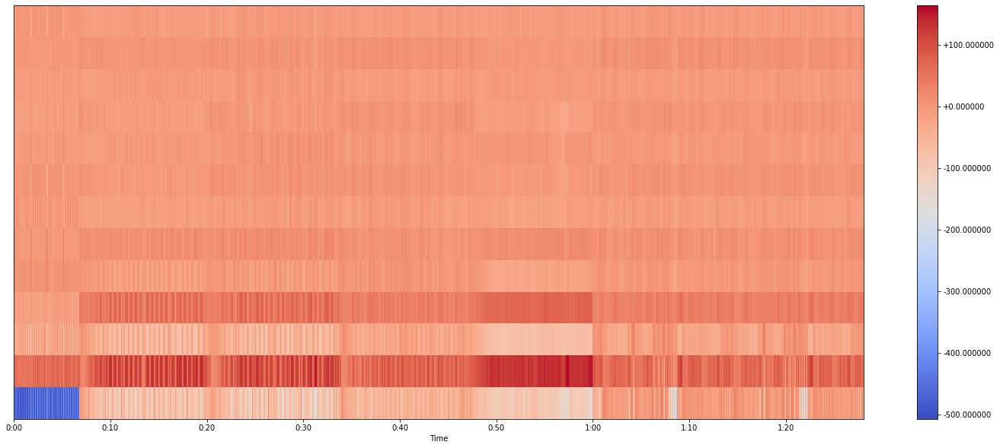

In [15]:
# Visualize MFCCs
plt.figure(figsize=(25,10))
librosa.display.specshow(mfccs,
                       x_axis='time',
                       sr=sr)
plt.colorbar(format="%+2f")
plt.show()

In [22]:
# Calculate delta and delta2 MFCCs
delta_mfccs = librosa.feature.delta(mfccs)
delta2_mfccs = librosa.feature.delta(mfccs, order=2)

In [19]:
delta_mfccs.shape

(13, 3793)

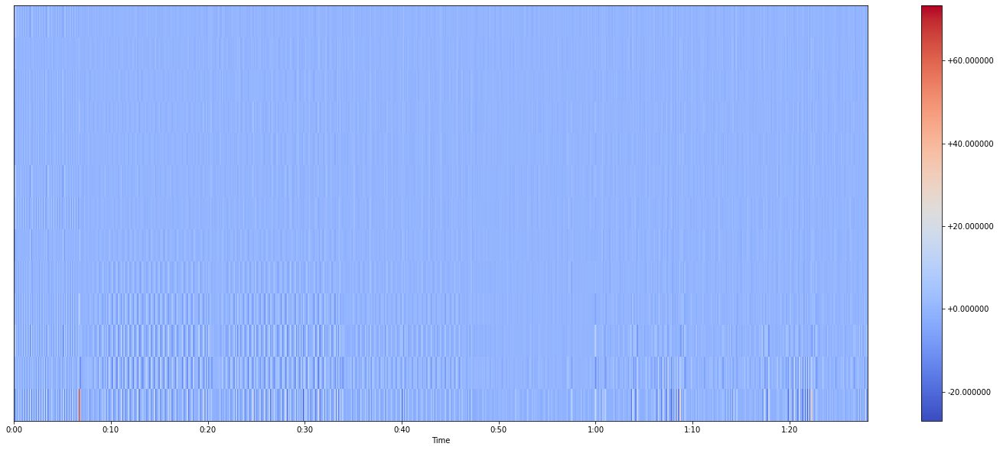

In [20]:
plt.figure(figsize=(25,10))
librosa.display.specshow(delta_mfccs,
                       x_axis='time',
                       sr=sr)
plt.colorbar(format="%+2f")
plt.show()

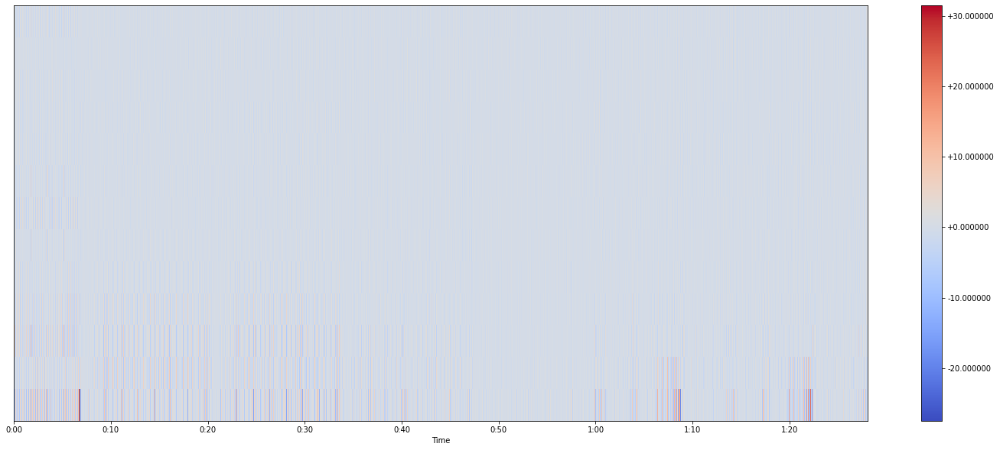

In [23]:
plt.figure(figsize=(25,10))
librosa.display.specshow(delta2_mfccs,
                       x_axis='time',
                       sr=sr)
plt.colorbar(format="%+2f")
plt.show()

In [25]:
#unique audio feature concatenate delta and delta2 mfccs
comprehensive_mfccs = np.concatenate((mfccs, delta_mfccs, delta2_mfccs))

In [26]:
comprehensive_mfccs.shape

(39, 3793)